# OBJECTIF
- Concevoir, implémenter et évaluer un modèle de classification supervisée permettant de prédire la présence ou l’absence de calculs biliaires (variable cible :  Gallstone Status, binaire : 1 = présent, 0 = absent). 

# 1. Chargement des bibliothèques

In [3]:
# Traitement des données
import pandas as pd
import numpy as np
from sklearn.experimental import enable_iterative_imputer  
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline


# Modèles de régression
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
#!pip install xgboost
from xgboost import XGBRegressor

# Statistiques
from scipy.stats import zscore
from scipy.stats import pearsonr
from itertools import combinations

# Évaluation
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
import os 

# 2. Analyse Exploratoire des données

In [4]:
import pandas as pd

# Charger le fichier Excel dans un DataFrame
df = pd.read_excel('dataset.xlsx')
print(f"Dimensions des données: {df.shape}")
# Afficher les premières lignes du DataFrame
df.head()


Dimensions des données: (319, 39)


,Gallstone Status,Age,Gender,Comorbidity,Coronary Artery Disease (CAD),Hypothyroidism,Hyperlipidemia,Diabetes Mellitus (DM),Height,Weight,...,High Density Lipoprotein (HDL),Triglyceride,Aspartat Aminotransferaz (AST),Alanin Aminotransferaz (ALT),Alkaline Phosphatase (ALP),Creatinine,Glomerular Filtration Rate (GFR),C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
0,0,50,0,0,0,0,0,0,185,92.8,...,40.0,134.0,20.0,22.0,87.0,0.82,112.47,0.0,16.0,33.0
1,0,47,0,1,0,0,0,0,176,94.5,...,43.0,103.0,14.0,13.0,46.0,0.87,107.10,0.0,14.4,25.0
2,0,61,0,0,0,0,0,0,171,91.1,...,43.0,69.0,18.0,14.0,66.0,1.25,65.51,0.0,16.2,30.2
3,0,41,0,0,0,0,0,0,168,67.7,...,59.0,53.0,20.0,12.0,34.0,1.02,94.10,0.0,15.4,35.4
4,0,42,0,0,0,0,0,0,178,89.6,...,30.0,326.0,27.0,54.0,71.0,0.82,112.47,0.0,16.8,40.6


In [ ]:
# ------------------------------- Nombre de modalités par variables -------------------
df.nunique()

Gallstone Status                                    2
Age                                                56
Gender                                              2
Comorbidity                                         4
Coronary Artery Disease (CAD)                       2
Hypothyroidism                                      2
Hyperlipidemia                                      2
Diabetes Mellitus (DM)                              2
Height                                             46
Weight                                            245
Body Mass Index (BMI)                             162
Total Body Water (TBW)                            199
Extracellular Water (ECW)                         109
Intracellular Water (ICW)                         138
Extracellular Fluid/Total Body Water (ECF/TBW)     81
Total Body Fat Ratio (TBFR) (%)                   228
Lean Mass (LM) (%)                                294
Body Protein Content (Protein) (%)                259
Visceral Fat Rating (VFR)   

In [15]:
# ------------------------------- Type des données -------------------
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319 entries, 0 to 318
Data columns (total 39 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Gallstone Status                                319 non-null    int64  
 1   Age                                             319 non-null    int64  
 2   Gender                                          319 non-null    int64  
 3   Comorbidity                                     319 non-null    int64  
 4   Coronary Artery Disease (CAD)                   319 non-null    int64  
 5   Hypothyroidism                                  319 non-null    int64  
 6   Hyperlipidemia                                  319 non-null    int64  
 7   Diabetes Mellitus (DM)                          319 non-null    int64  
 8   Height                                          319 non-null    int64  
 9   Weight                                     

- 319 enregistrements sur 39 variables
- Aucune valeur manquante

In [16]:
# --------------------------------- Valeurs manquantes -----------------------------------
df.isna().sum()/df.shape[0]*100

Gallstone Status                                  0.0
Age                                               0.0
Gender                                            0.0
Comorbidity                                       0.0
Coronary Artery Disease (CAD)                     0.0
Hypothyroidism                                    0.0
Hyperlipidemia                                    0.0
Diabetes Mellitus (DM)                            0.0
Height                                            0.0
Weight                                            0.0
Body Mass Index (BMI)                             0.0
Total Body Water (TBW)                            0.0
Extracellular Water (ECW)                         0.0
Intracellular Water (ICW)                         0.0
Extracellular Fluid/Total Body Water (ECF/TBW)    0.0
Total Body Fat Ratio (TBFR) (%)                   0.0
Lean Mass (LM) (%)                                0.0
Body Protein Content (Protein) (%)                0.0
Visceral Fat Rating (VFR)   

In [6]:
# ------------------------------- Liste des variables binaires -------------------
col_bin = [col for col in df.columns if df[col].nunique() == 2]
num_col = [col for col in df.columns if df[col].nunique() > 2]
print(f" Nombre de Variables binaire : {len(col_bin)}")
print(col_bin)
print(f" \n Nombre de Variables Non binaire : {len(num_col)}")
print(num_col)

 Nombre de Variables binaire : 6
['Gallstone Status', 'Gender', 'Coronary Artery Disease (CAD)', 'Hypothyroidism', 'Hyperlipidemia', 'Diabetes Mellitus (DM)']
 
 Nombre de Variables Non binaire : 33
['Age', 'Comorbidity', 'Height', 'Weight', 'Body Mass Index (BMI)', 'Total Body Water (TBW)', 'Extracellular Water (ECW)', 'Intracellular Water (ICW)', 'Extracellular Fluid/Total Body Water (ECF/TBW)', 'Total Body Fat Ratio (TBFR) (%)', 'Lean Mass (LM) (%)', 'Body Protein Content (Protein) (%)', 'Visceral Fat Rating (VFR)', 'Bone Mass (BM)', 'Muscle Mass (MM)', 'Obesity (%)', 'Total Fat Content (TFC)', 'Visceral Fat Area (VFA)', 'Visceral Muscle Area (VMA) (Kg)', 'Hepatic Fat Accumulation (HFA)', 'Glucose', 'Total Cholesterol (TC)', 'Low Density Lipoprotein (LDL)', 'High Density Lipoprotein (HDL)', 'Triglyceride', 'Aspartat Aminotransferaz (AST)', 'Alanin Aminotransferaz (ALT)', 'Alkaline Phosphatase (ALP)', 'Creatinine', 'Glomerular Filtration Rate (GFR)', 'C-Reactive Protein (CRP)', 'Hemo

## 1.a Analyse univariée

In [ ]:
# ----------------------------- Statistiques descriptives ---------------------------------
df_copie = df.copy()
df_copie[col_bin] = df_copie[col_bin].astype('category')

print("Statistiques descriptive des variables binaires:")
display(df_copie[col_bin].describe().T)

print("\n Statistiques descriptive des variables numériques:")
display(df_copie[num_col].describe().T)

Statistiques descriptive des variables binaires:


,count,unique,top,freq
Gallstone Status,319,2,0,161
Gender,319,2,0,162
Coronary Artery Disease (CAD),319,2,0,307
Hypothyroidism,319,2,0,310
Hyperlipidemia,319,2,0,311
Diabetes Mellitus (DM),319,2,0,276



 Statistiques descriptive des variables numériques:


,count,mean,std,min,25%,50%,75%,max
Age,319.0,48.068966,12.114558,20.00,38.500,49.000000,56.000,96.00
Comorbidity,319.0,0.335423,0.517340,0.00,0.000,0.000000,1.000,3.00
Height,319.0,167.156740,10.053030,145.00,159.500,168.000000,175.000,191.00
Weight,319.0,80.564890,15.709069,42.90,69.600,78.800000,91.250,143.50
Body Mass Index (BMI),319.0,28.877116,5.313707,17.40,25.250,28.300000,31.850,49.70
Total Body Water (TBW),319.0,40.587774,7.930235,13.00,34.200,39.800000,47.000,66.20
Extracellular Water (ECW),319.0,17.071160,3.161857,9.00,14.800,17.100000,19.400,27.80
Intracellular Water (ICW),319.0,23.634483,5.349332,13.80,19.300,23.000000,27.550,57.10
Extracellular Fluid/Total Body Water (ECF/TBW),319.0,42.212038,3.244470,29.23,40.075,42.000000,44.000,52.00
Total Body Fat Ratio (TBFR) (%),319.0,28.274984,8.444417,6.30,22.025,27.820000,34.810,50.92


In [ ]:
# --------------------------------- Visualition des relations lineaires et la distribution ----------------------------
sns.pairplot(df_copie[num_col])

- Graphiquement, certaines variables presentent des relations linéaires entre elle. Cette pourrait être évaluer par le test de corrélation linéaire de Pearson
- Certaine varibles semblent suivre une distribution normale, par contre d'autres en sont loin.

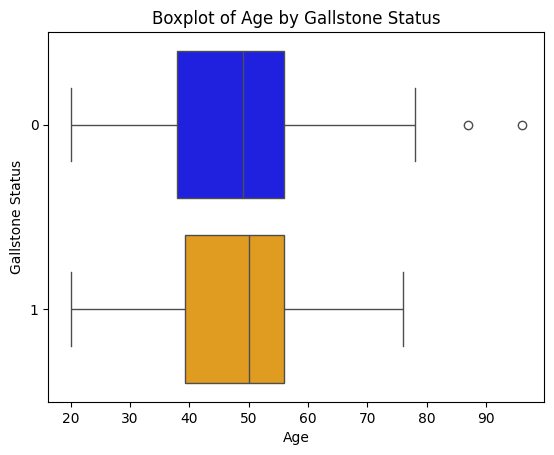

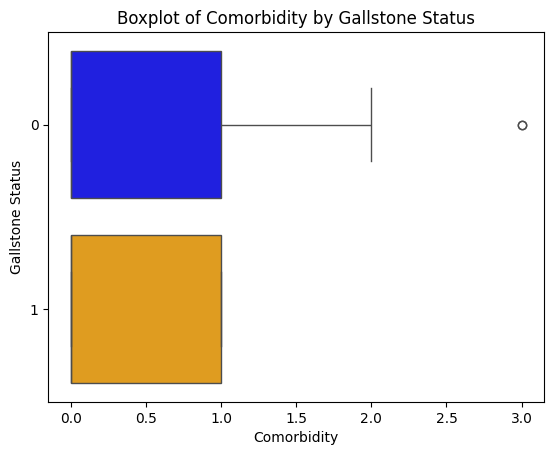

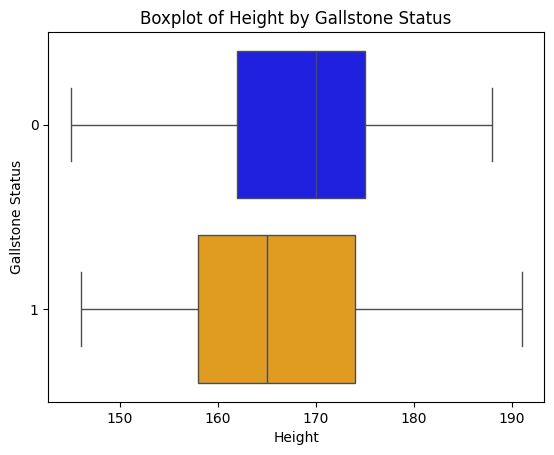

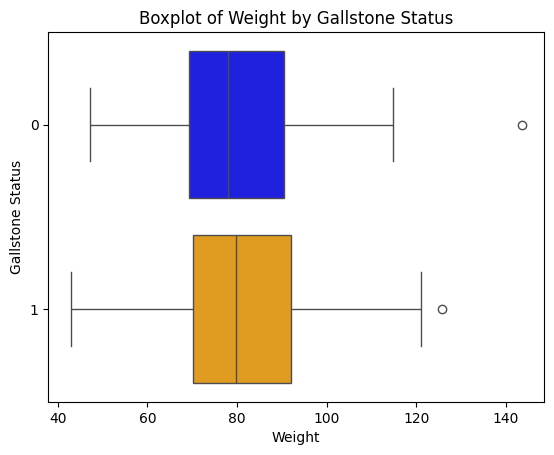

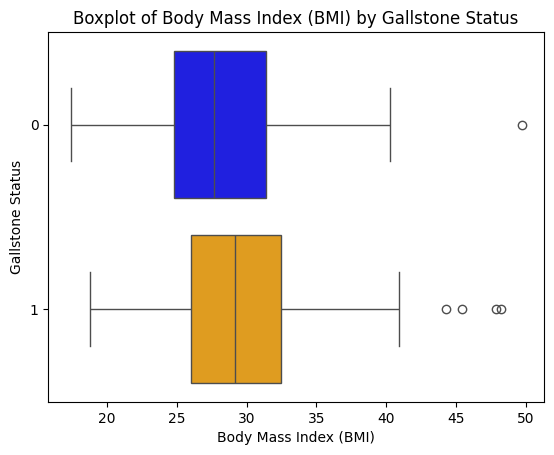

...

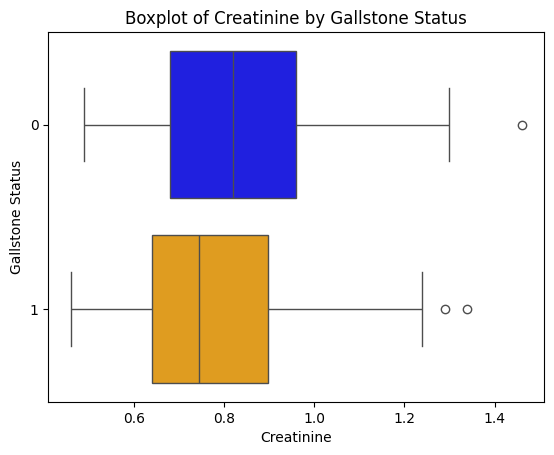

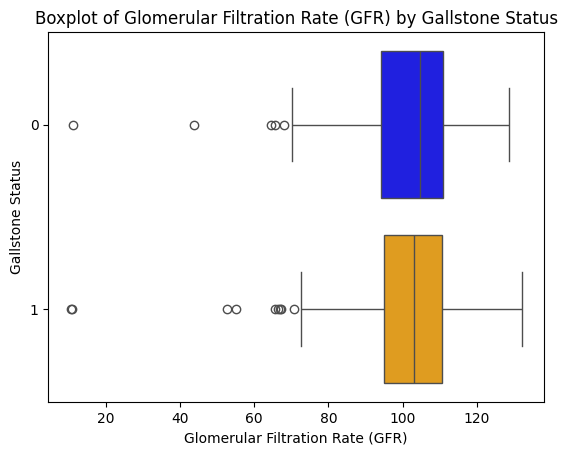

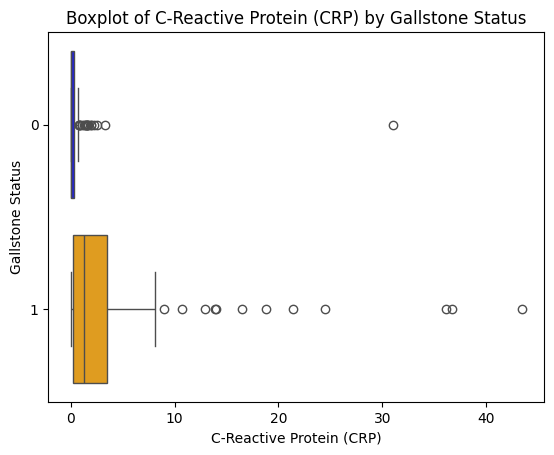

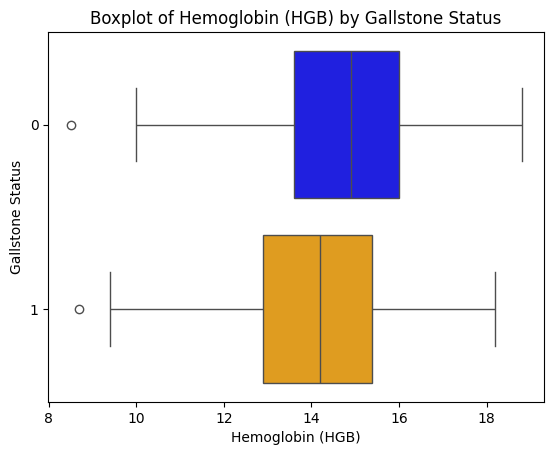

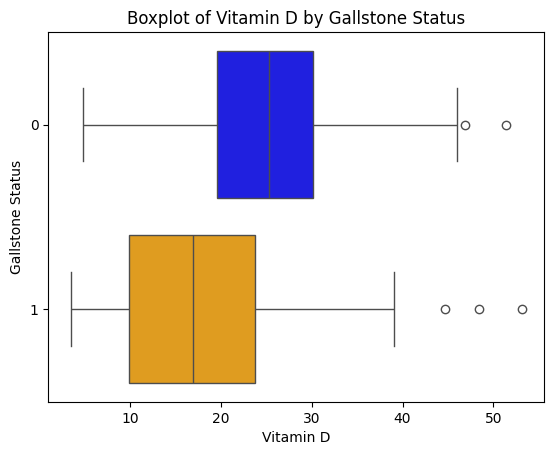

In [31]:
# --------------------------------- Valeurs extremes par boxplot ----------------------------

for col in df_copie[num_col].columns:
    # Créer un boxplot pour chaque colonne numérique
    plt.figure()  # Créer une nouvelle figure pour chaque boxplot
    sns.boxplot(x=df_copie[col], y="Gallstone Status", data=df_copie, palette={"0": "blue", "1": "orange"})
    plt.title(f'Boxplot of {col} by Gallstone Status')  # Ajouter un titre
    plt.show()  # Afficher le graphique


In [7]:
# --------------------------------- Dataframe des valeurs extremes----------------------------

def detect_outliers_zscore(df, seuil=3.0):
   
    df_numeric = df[num_col]
    resume = []
    extremes_rows = pd.DataFrame()
    non_extremes_rows = pd.DataFrame()

    # Initialisation
    extremes_index = set()

    for col in df_numeric.columns:
        serie = df[col].dropna()
        zscores = zscore(serie)
        abs_z = np.abs(zscores)

        extremes_mask = abs_z >= seuil
        extremes_index.update(serie.index[extremes_mask])  # Ajoute les index extrêmes à un set()

        # Résumé
        resume.append({
            "variable": col,
            "max": serie.max(),
            "min": serie.min(),
            "z_max": zscores[serie.idxmax()],
            "z_min": zscores[serie.idxmin()],
            "seuil_z": seuil,
            "nb_valeurs_extremes": extremes_mask.sum(),
            "proportion_extremes": round(extremes_mask.sum() / len(serie), 4)
        })

    # Convertir le set d'index extrêmes en liste
    extremes_index = list(extremes_index)

    # DataFrames finaux
    extremes_rows = df.loc[extremes_index].copy()
    non_extremes_rows = df.drop(index=extremes_index).copy()

    print(f"\n Nombre de valeurs extremes (lignes) : {extremes_rows.shape[0]}")
    print(f"\n Nombre de valeurs ordinaires : {non_extremes_rows.shape[0]}")

    df_resume = pd.DataFrame(resume).set_index("variable")
    return df_resume, extremes_rows, non_extremes_rows



# Exécution de la fonction

df_resume, extremes_rows, non_extremes_rows = detect_outliers_zscore(df, seuil=3.0)



 Nombre de valeurs extremes (lignes) : 52

 Nombre de valeurs ordinaires : 267


In [36]:
df_resume

,max,min,z_max,z_min,seuil_z,nb_valeurs_extremes,proportion_extremes
variable,,,,,,,
Age,96.00,20.00,3.962698,-2.320602,3.0,2,0.0063
Comorbidity,3.00,0.00,5.158626,-0.649380,3.0,3,0.0094
Height,191.00,145.00,2.375475,-2.207449,3.0,0,0.0000
Weight,143.50,42.90,4.012586,-2.401419,3.0,1,0.0031
Body Mass Index (BMI),49.70,17.40,3.924868,-2.163301,3.0,4,0.0125
Total Body Water (TBW),66.20,13.00,3.234767,-3.484275,3.0,2,0.0063
Extracellular Water (ECW),27.80,9.00,3.398539,-2.556675,3.0,1,0.0031
Intracellular Water (ICW),57.10,13.80,6.265847,-1.841339,3.0,1,0.0031
Extracellular Fluid/Total Body Water (ECF/TBW),52.00,29.23,3.021553,-4.007568,3.0,4,0.0125


#### Commentaire:
- Nous utilisons le z-score pour detecter les valeurs extremes à au moins 3 ecart-type de la moyenne
- Il y a 52 enregistrements qui presentent des valeurs extremes dans au moins une variable.
- Pour éviter trop de biais dans le modèle, nous allons les suprimer.


## 1.b Analyse bivariée

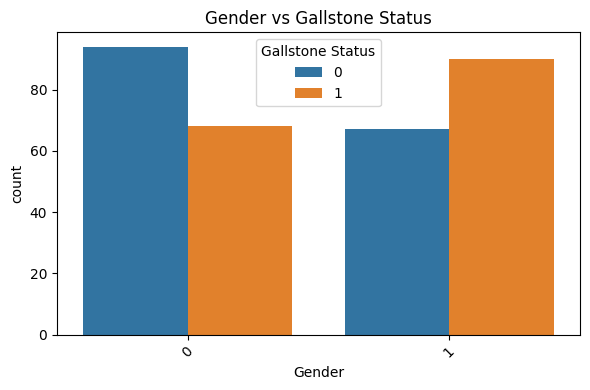

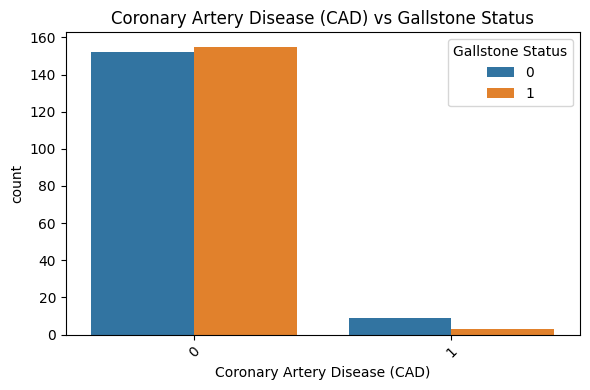

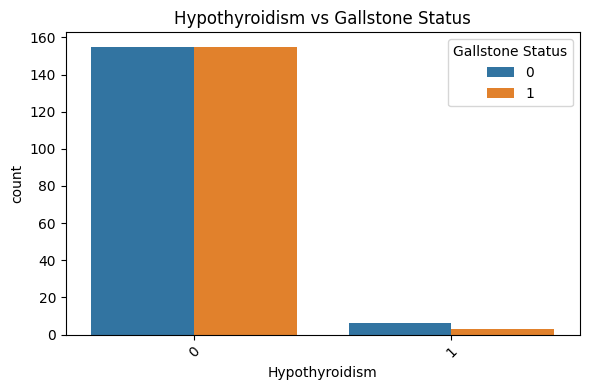

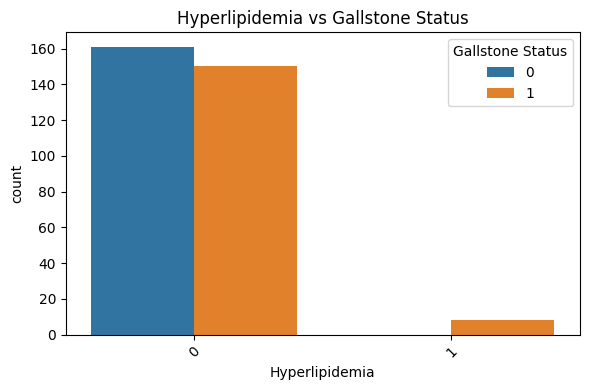

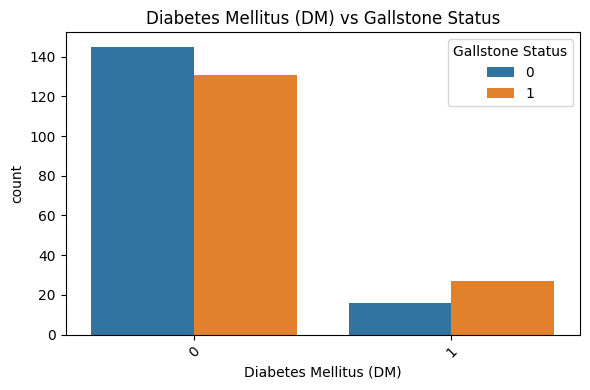

In [ ]:
# ------------------- Representation visuelle de l'interaction entre cible et variables cat ----------------

def plot_cat_target_relation(df, target_col, cat_cols):
    for col in cat_cols:
        plt.figure(figsize=(6, 4))
        sns.countplot(data=df, x=col, hue=target_col)
        plt.title(f"{col} vs {target_col}")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

target_col = 'Gallstone Status'
cat_cols = ['Gender', 'Coronary Artery Disease (CAD)', 'Hypothyroidism', 'Hyperlipidemia', 'Diabetes Mellitus (DM)']
plot_cat_target_relation(df_copie, target_col, cat_cols)

In [ ]:
# ------------------- Validation de l'interaction par le test de Khi2 ----------------
from scipy.stats import chi2_contingency

def chi2_test_categorielles(df, target_col, cat_cols):
    resultats = []
    for col in cat_cols:
        table = pd.crosstab(df[col], df[target_col])
        chi2, p, _, _ = chi2_contingency(table)
        resultats.append({
            "Variable": col,
            "p_value": p,
            "Significatif (<0.05)": p < 0.05
        })
    test_khi2 = pd.DataFrame(resultats).sort_values(by="p_value")
    kh2_var_No_sign = test_khi2[test_khi2["Significatif (<0.05)"]==False]["Variable"].unique().tolist()
    return test_khi2, kh2_var_No_sign

test_khi2, kh2_var_No_sign = chi2_test_categorielles(df_copie, target_col, cat_cols)
print(f"\n Liste des variables non significatives au sens de khi2: {kh2_var_No_sign} \n")
display(test_khi2)


 Liste des variables non significatives au sens de khi2: ['Diabetes Mellitus (DM)', 'Coronary Artery Disease (CAD)', 'Hypothyroidism'] 



,Variable,p_value,Significatif (<0.05)
0,Gender,0.008556,True
3,Hyperlipidemia,0.011291,True
4,Diabetes Mellitus (DM),0.088035,False
1,Coronary Artery Disease (CAD),0.150386,False
2,Hypothyroidism,0.517190,False


- Le test n'est pas significatives pour 3 variables
- Au seuil de 5%, l'hypothèse selon laquelle la cible est independante des autres variables cat est rejetée pour *Gender* et *Hyperlipidemia*
- Il y a donc un effet de genre et de Hyperlipidemia sur notre variable cible
- Les 3 autres variables catégorielles peuvent etre extraites du modèle

In [50]:
# ----------------------------- Test de normalité de shapiro --------------------------
from scipy.stats import shapiro, normaltest

def test_normalite_variables(df, alpha=0.05, methode="shapiro"):
    
    numeriques = df[num_col]
    resultats = []

    for col in numeriques.columns:
        serie = df[col].dropna()
        if methode == "shapiro":
            stat, p = shapiro(serie)
        elif methode == "dagostino":
            stat, p = normaltest(serie)
        else:
            raise ValueError("Méthode inconnue : choisir 'shapiro' ou 'dagostino'")
        
        resultats.append({
            "Variable": col,
            "Test utilisé": methode,
            "p-value": p,
            "Normale (p ≥ {:.2f})".format(alpha): p >= alpha
        })
    test_normalite = pd.DataFrame(resultats).sort_values(by="p-value")
    var_Norm = test_normalite[test_normalite["Normale (p ≥ 0.05)"]==True]["Variable"].unique().tolist()
    return test_normalite, var_Norm

test_normalite, var_Norm = test_normalite_variables(df, alpha=0.05, methode="shapiro")
print(f"\n Liste des variables normale par Shapiro: {var_Norm} \n")
display(test_normalite)


 Liste des variables normale par Shapiro: ['Lean Mass (LM) (%)', 'Extracellular Water (ECW)', 'Visceral Muscle Area (VMA) (Kg)'] 



,Variable,Test utilisé,p-value,Normale (p ≥ 0.05)
15,Obesity (%),shapiro,8.071169e-36,False
30,C-Reactive Protein (CRP),shapiro,1.987806e-31,False
20,Glucose,shapiro,2.439544e-30,False
25,Aspartat Aminotransferaz (AST),shapiro,2.590639e-30,False
26,Alanin Aminotransferaz (ALT),shapiro,2.537554e-29,False
1,Comorbidity,shapiro,1.824123e-26,False
23,High Density Lipoprotein (HDL),shapiro,4.176459e-25,False
24,Triglyceride,shapiro,1.497191e-20,False
19,Hepatic Fat Accumulation (HFA),shapiro,3.232331e-19,False
29,Glomerular Filtration Rate (GFR),shapiro,5.084031e-15,False


### H₀ : les données suivent une loi normale

- Si p-value < 0.05 → on rejette H₀ → la distribution n’est pas normale
- Les test de shapiro confirme la normalité de : Lean Mass (LM) (%), Extracellular Water (ECW), Visceral Muscle Area (VMA) (Kg)
- La normalité n'étant pas garantie pour la majeur partie des variables, on ne peut pas utiliser le test de student pour evaluer leur interaction avec la cible
- On va utiliser test de Mann–Whitney U, qui n’exige pas la normalité des données.

In [42]:
# ------------------- Interaction entre la variable cible et les variables num par le test de student ----------------

from scipy.stats import ttest_ind

def ttest_cible_vs_num(df, target_col, num_cols):
    resultats = []
    for col in num_cols:
        group_0 = df[df[target_col] == 0][col]
        group_1 = df[df[target_col] == 1][col]
        stat, p_value = ttest_ind(group_0, group_1, equal_var=False)
        resultats.append({
            "Variable": col,
            "p_value": p_value,
            "Moyenne_0": group_0.mean(),
            "Moyenne_1": group_1.mean(),
            "Différence moyenne": group_1.mean() - group_0.mean(),
            "Significatif (<0.05)": p_value < 0.05
        })
    resume = pd.DataFrame(resultats).sort_values(by="p_value")
    print("\n Test de student significatif au seuil de 5%")
    display(resume[resume["Significatif (<0.05)"]==True])

    print("\n Test de student Non significatif au seuil de 5%")
    display(resume[resume["Significatif (<0.05)"]==False])
    print("\n Liste des variables non significatives:")
    print(resume[resume["Significatif (<0.05)"]==False]["Variable"].unique())

    return resume

ttest_cible_vs_num(df_copie, target_col, num_col)


 Test de student significatif au seuil de 5%


,Variable,p_value,Moyenne_0,Moyenne_1,Différence moyenne,Significatif (<0.05)
32,Vitamin D,6.883303e-11,24.904969,17.831329,-7.073640,True
30,C-Reactive Protein (CRP),4.910806e-07,0.462174,3.271962,2.809788,True
10,Lean Mass (LM) (%),4.697010e-05,73.522236,69.718481,-3.803755,True
9,Total Body Fat Ratio (TBFR) (%),4.799254e-05,26.391801,30.193924,3.802123,True
13,Bone Mass (BM),9.659621e-05,2.912422,2.692089,-0.220334,True
31,Hemoglobin (HGB),4.049378e-04,14.763975,14.065823,-0.698152,True
6,Extracellular Water (ECW),1.391087e-03,17.629193,16.502532,-1.126661,True
16,Total Fat Content (TFC),2.284872e-03,21.870807,25.135443,3.264636,True
8,Extracellular Fluid/Total Body Water (ECF/TBW),2.408269e-03,42.757019,41.656709,-1.100310,True
23,High Density Lipoprotein (HDL),4.803648e-03,46.695652,52.308228,5.612576,True



 Test de student Non significatif au seuil de 5%


,Variable,p_value,Moyenne_0,Moyenne_1,Différence moyenne,Significatif (<0.05)
2,Height,0.054270,168.229814,166.063291,-2.166523,False
14,Muscle Mass (MM),0.096489,55.251553,53.275949,-1.975603,False
19,Hepatic Fat Accumulation (HFA),0.107653,1.055901,1.246835,0.190935,False
11,Body Protein Content (Protein) (%),0.124163,16.138385,15.735443,-0.402942,False
18,Visceral Muscle Area (VMA) (Kg),0.192886,30.725466,30.075316,-0.650149,False
22,Low Density Lipoprotein (LDL),0.315293,128.804969,124.458861,-4.346108,False
15,Obesity (%),0.342136,29.994348,41.817089,11.822741,False
24,Triglyceride,0.364834,149.424783,139.486076,-9.938707,False
3,Weight,0.386146,79.808696,81.335443,1.526747,False
1,Comorbidity,0.386942,0.360248,0.310127,-0.050122,False



 Liste des variables non significatives:
['Height' 'Muscle Mass (MM)' 'Hepatic Fat Accumulation (HFA)'
 'Body Protein Content (Protein) (%)' 'Visceral Muscle Area (VMA) (Kg)'
 'Low Density Lipoprotein (LDL)' 'Obesity (%)' 'Triglyceride' 'Weight'
 'Comorbidity' 'Alanin Aminotransferaz (ALT)' 'Age'
 'Intracellular Water (ICW)' 'Glomerular Filtration Rate (GFR)'
 'Visceral Fat Rating (VFR)' 'Total Cholesterol (TC)' 'Glucose']


,Variable,p_value,Moyenne_0,Moyenne_1,Différence moyenne,Significatif (<0.05)
32,Vitamin D,6.883303e-11,24.904969,17.831329,-7.073640,True
30,C-Reactive Protein (CRP),4.910806e-07,0.462174,3.271962,2.809788,True
10,Lean Mass (LM) (%),4.697010e-05,73.522236,69.718481,-3.803755,True
9,Total Body Fat Ratio (TBFR) (%),4.799254e-05,26.391801,30.193924,3.802123,True
13,Bone Mass (BM),9.659621e-05,2.912422,2.692089,-0.220334,True
31,Hemoglobin (HGB),4.049378e-04,14.763975,14.065823,-0.698152,True
6,Extracellular Water (ECW),1.391087e-03,17.629193,16.502532,-1.126661,True
16,Total Fat Content (TFC),2.284872e-03,21.870807,25.135443,3.264636,True
8,Extracellular Fluid/Total Body Water (ECF/TBW),2.408269e-03,42.757019,41.656709,-1.100310,True
23,High Density Lipoprotein (HDL),4.803648e-03,46.695652,52.308228,5.612576,True


#### Sous l'hypothèse de la normalité des varibles
- Pour 16 variables numériques, la moyenne des deux groupes sont statistiquement differents
- Pour 17 pas de difference significative

In [51]:
# ------------------- Interaction entre la variable cible et les variables num par le test de mannwhitneyu ----------------

from scipy.stats import mannwhitneyu

def mannwhitney_cible_vs_num(df, target_col, num_cols):
    resultats = []

    for col in num_cols:
        group_0 = df[df[target_col] == 0][col]
        group_1 = df[df[target_col] == 1][col]

        stat, p_value = mannwhitneyu(group_0, group_1, alternative='two-sided')

        resultats.append({
            "Variable": col,
            "p_value": p_value,
            "Médiane_0": group_0.median(),
            "Médiane_1": group_1.median(),
            "Différence médiane": group_1.median() - group_0.median(),
            "Significatif (<0.05)": p_value < 0.05
        })

    resume = pd.DataFrame(resultats).sort_values(by="p_value")

    print("\n🔍 Test de Mann–Whitney U : Résultats significatifs au seuil de 5%")
    display(resume[resume["Significatif (<0.05)"] == True])

    print("\nℹ️ Test de Mann–Whitney U : Résultats non significatifs au seuil de 5%")
    display(resume[resume["Significatif (<0.05)"] == False])

    print("\n Liste des variables non significatives au sens de mannwhitneyu :\n")
    print(resume[resume["Significatif (<0.05)"] == False]["Variable"].unique())
    num_var_No_Sign = resume[resume["Significatif (<0.05)"] == False]["Variable"].unique().tolist()

    return resume, num_var_No_Sign

resume, num_var_No_Sign = mannwhitney_cible_vs_num(df, target_col, num_col)
resume


🔍 Test de Mann–Whitney U : Résultats significatifs au seuil de 5%


,Variable,p_value,Médiane_0,Médiane_1,Différence médiane,Significatif (<0.05)
30,C-Reactive Protein (CRP),1.764035e-20,0.00,1.290,1.290,True
32,Vitamin D,1.363600e-11,25.27,17.000,-8.270,True
25,Aspartat Aminotransferaz (AST),2.379097e-07,20.00,16.500,-3.500,True
10,Lean Mass (LM) (%),4.840835e-05,73.93,68.790,-5.140,True
9,Total Body Fat Ratio (TBFR) (%),4.941677e-05,25.80,31.050,5.250,True
13,Bone Mass (BM),9.394115e-05,2.90,2.600,-0.300,True
16,Total Fat Content (TFC),5.822191e-04,20.10,24.750,4.650,True
31,Hemoglobin (HGB),6.265234e-04,14.90,14.200,-0.700,True
6,Extracellular Water (ECW),1.312565e-03,17.50,16.550,-0.950,True
23,High Density Lipoprotein (HDL),1.812496e-03,45.00,47.500,2.500,True



ℹ️ Test de Mann–Whitney U : Résultats non significatifs au seuil de 5%


,Variable,p_value,Médiane_0,Médiane_1,Différence médiane,Significatif (<0.05)
5,Total Body Water (TBW),0.061087,41.60,38.250000,-3.350000,False
11,Body Protein Content (Protein) (%),0.062614,16.13,15.610000,-0.520000,False
19,Hepatic Fat Accumulation (HFA),0.095773,1.00,2.000000,1.000000,False
14,Muscle Mass (MM),0.124406,55.20,52.250000,-2.950000,False
22,Low Density Lipoprotein (LDL),0.151396,125.00,119.000000,-6.000000,False
26,Alanin Aminotransferaz (ALT),0.204799,21.00,18.000000,-3.000000,False
18,Visceral Muscle Area (VMA) (Kg),0.228404,30.80,29.906757,-0.893243,False
20,Glucose,0.264265,99.00,97.000000,-2.000000,False
3,Weight,0.361853,78.00,79.850000,1.850000,False
7,Intracellular Water (ICW),0.441743,23.60,22.550000,-1.050000,False



 Liste des variables non significatives au sens de mannwhitneyu :

['Total Body Water (TBW)' 'Body Protein Content (Protein) (%)'
 'Hepatic Fat Accumulation (HFA)' 'Muscle Mass (MM)'
 'Low Density Lipoprotein (LDL)' 'Alanin Aminotransferaz (ALT)'
 'Visceral Muscle Area (VMA) (Kg)' 'Glucose' 'Weight'
 'Intracellular Water (ICW)' 'Age' 'Glomerular Filtration Rate (GFR)'
 'Comorbidity' 'Triglyceride' 'Total Cholesterol (TC)' 'Obesity (%)'
 'Visceral Fat Rating (VFR)']


,Variable,p_value,Médiane_0,Médiane_1,Différence médiane,Significatif (<0.05)
30,C-Reactive Protein (CRP),1.764035e-20,0.00,1.290000,1.290000,True
32,Vitamin D,1.363600e-11,25.27,17.000000,-8.270000,True
25,Aspartat Aminotransferaz (AST),2.379097e-07,20.00,16.500000,-3.500000,True
10,Lean Mass (LM) (%),4.840835e-05,73.93,68.790000,-5.140000,True
9,Total Body Fat Ratio (TBFR) (%),4.941677e-05,25.80,31.050000,5.250000,True
13,Bone Mass (BM),9.394115e-05,2.90,2.600000,-0.300000,True
16,Total Fat Content (TFC),5.822191e-04,20.10,24.750000,4.650000,True
31,Hemoglobin (HGB),6.265234e-04,14.90,14.200000,-0.700000,True
6,Extracellular Water (ECW),1.312565e-03,17.50,16.550000,-0.950000,True
23,High Density Lipoprotein (HDL),1.812496e-03,45.00,47.500000,2.500000,True


# Test de Mann–Whitney U : Résultats non significatifs au seuil de 5%
- Les 17 variables pour lesquelles le test n'est pas significatif ne discriminent pas les cas positifs des cas négatifs de notre cible

 - Liste des variables non significatives au sens de mannwhitneyu :
['Total Body Water (TBW)' 'Body Protein Content (Protein) (%)'
 'Hepatic Fat Accumulation (HFA)' 'Muscle Mass (MM)'
 'Low Density Lipoprotein (LDL)' 'Alanin Aminotransferaz (ALT)'
 'Visceral Muscle Area (VMA) (Kg)' 'Glucose' 'Weight'
 'Intracellular Water (ICW)' 'Age' 'Glomerular Filtration Rate (GFR)'
 'Comorbidity' 'Triglyceride' 'Total Cholesterol (TC)' 'Obesity (%)'
 'Visceral Fat Rating (VFR)']

 

# 2. Analyse des correlations

In [57]:
len(num_col)

33

In [66]:
# ------------------------- Correlation linéaire de Pearson -------------------------
from scipy.stats import pearsonr
from itertools import combinations

def correlation_pearson_pairs(df, seuil=0.05, seuil_corr=0.8):
    num_cols = df.select_dtypes(include=[np.number]).columns
    resultats = []

    # Initialisation pour matrice corrélation
    correlation_matrix = pd.DataFrame(index=num_cols, columns=num_cols, dtype=float)

    for var1, var2 in combinations(num_cols, 2):  # paires uniques
        x = df[var1].dropna()
        y = df[var2].dropna()

        # Aligner les index
        common_idx = x.index.intersection(y.index)
        x = x.loc[common_idx]
        y = y.loc[common_idx]

        r, p = pearsonr(x, y)
        r = round(r, 2)

        resultats.append({
            "Variable_1": var1,
            "Variable_2": var2,
            "Corrélation (r)": r,
            "p-value": p,
            "Significatif (<0.05)": p < seuil
        })

        # Remplir matrice symétrique
        correlation_matrix.loc[var1, var2] = r
        correlation_matrix.loc[var2, var1] = r

    # Table des résultats
    df_corr = pd.DataFrame(resultats).sort_values(by="p-value")

    # Liste des couples fortement corrélés (|r| >= seuil_corr) et celle en dessous du seuil
    forte_corr = df_corr[np.abs(df_corr["Corrélation (r)"]) >= seuil_corr]
    faible_corr = df_corr[np.abs(df_corr["Corrélation (r)"]) < seuil_corr]

    print(f"\n Couples de variables fortement corrélés (|r| ≥ {seuil_corr}) :")
    display(forte_corr[["Variable_1", "Variable_2", "Corrélation (r)"]])

    print(f"\n Couples de variables dont la corrélation est en dessous du seuil (|r| < {seuil_corr}) :")
    display(faible_corr[["Variable_1", "Variable_2", "Corrélation (r)"]])

    print(f"\n Correlation de l'ensemble des variables:")
    display(df_corr[["Variable_1", "Variable_2", "Corrélation (r)"]])

    print(f"\n Matrice de corrélation linéaire (valeurs de r entre -1 et 1) :")
    correlation_matrix = correlation_matrix.fillna(1)
    display(correlation_matrix)

# Deroulement de la fonction    
correlation_pearson_pairs(df_copie, seuil=0.05, seuil_corr=0.8)


 Couples de variables fortement corrélés (|r| ≥ 0.8) :


,Variable_1,Variable_2,Corrélation (r)
252,Total Body Fat Ratio (TBFR) (%),Lean Mass (LM) (%),-0.99
158,Total Body Water (TBW),Muscle Mass (MM),0.93
150,Total Body Water (TBW),Extracellular Water (ECW),0.90
209,Intracellular Water (ICW),Muscle Mass (MM),0.90
133,Body Mass Index (BMI),Total Fat Content (TFC),0.90
106,Weight,Visceral Fat Area (VFA),0.88
392,Total Fat Content (TFC),Visceral Fat Area (VFA),0.87
258,Total Body Fat Ratio (TBFR) (%),Total Fat Content (TFC),0.87
462,Total Cholesterol (TC),Low Density Lipoprotein (LDL),0.87
184,Extracellular Water (ECW),Muscle Mass (MM),0.87



 Couples de variables dont la corrélation est en dessous du seuil (|r| < 0.8) :


,Variable_1,Variable_2,Corrélation (r)
208,Intracellular Water (ICW),Bone Mass (BM),0.79
93,Weight,Body Mass Index (BMI),0.79
95,Weight,Extracellular Water (ECW),0.79
177,Extracellular Water (ECW),Intracellular Water (ICW),0.78
103,Weight,Muscle Mass (MM),0.77
...,...,...,...
426,Visceral Muscle Area (VMA) (Kg),Low Density Lipoprotein (LDL),-0.00
374,Muscle Mass (MM),Vitamin D,-0.00
369,Muscle Mass (MM),Alkaline Phosphatase (ALP),-0.00
418,Visceral Fat Area (VFA),Creatinine,-0.00



 Correlation de l'ensemble des variables:


,Variable_1,Variable_2,Corrélation (r)
252,Total Body Fat Ratio (TBFR) (%),Lean Mass (LM) (%),-0.99
158,Total Body Water (TBW),Muscle Mass (MM),0.93
150,Total Body Water (TBW),Extracellular Water (ECW),0.90
209,Intracellular Water (ICW),Muscle Mass (MM),0.90
133,Body Mass Index (BMI),Total Fat Content (TFC),0.90
...,...,...,...
426,Visceral Muscle Area (VMA) (Kg),Low Density Lipoprotein (LDL),-0.00
374,Muscle Mass (MM),Vitamin D,-0.00
369,Muscle Mass (MM),Alkaline Phosphatase (ALP),-0.00
418,Visceral Fat Area (VFA),Creatinine,-0.00



 Matrice de corrélation linéaire (valeurs de r entre -1 et 1) :


,Age,Comorbidity,Height,Weight,Body Mass Index (BMI),Total Body Water (TBW),Extracellular Water (ECW),Intracellular Water (ICW),Extracellular Fluid/Total Body Water (ECF/TBW),Total Body Fat Ratio (TBFR) (%),...,High Density Lipoprotein (HDL),Triglyceride,Aspartat Aminotransferaz (AST),Alanin Aminotransferaz (ALT),Alkaline Phosphatase (ALP),Creatinine,Glomerular Filtration Rate (GFR),C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
Age,1.00,0.33,-0.31,0.04,0.24,-0.08,0.01,-0.20,0.33,0.24,...,0.10,0.06,-0.06,-0.06,0.12,0.11,-0.56,-0.00,-0.12,0.06
Comorbidity,0.33,1.00,-0.07,0.08,0.13,0.04,0.11,-0.04,0.22,0.10,...,-0.10,0.17,-0.05,-0.02,-0.07,0.04,-0.19,-0.05,-0.00,0.07
Height,-0.31,-0.07,1.00,0.41,-0.22,0.71,0.61,0.74,-0.40,-0.53,...,-0.31,0.24,0.18,0.25,-0.07,0.47,0.09,-0.10,0.60,0.00
Weight,0.04,0.08,0.41,1.00,0.79,0.77,0.79,0.69,-0.06,0.37,...,-0.25,0.31,0.13,0.23,0.08,0.18,-0.04,0.05,0.30,-0.09
Body Mass Index (BMI),0.24,0.13,-0.22,0.79,1.00,0.34,0.43,0.23,0.21,0.75,...,-0.07,0.17,0.02,0.07,0.15,-0.13,-0.10,0.14,-0.07,-0.09
Total Body Water (TBW),-0.08,0.04,0.71,0.77,0.34,1.00,0.90,0.82,-0.23,-0.23,...,-0.38,0.33,0.23,0.32,0.01,0.47,-0.02,-0.05,0.56,0.04
Extracellular Water (ECW),0.01,0.11,0.61,0.79,0.43,0.90,1.00,0.78,0.12,-0.10,...,-0.36,0.29,0.23,0.31,0.02,0.41,-0.03,-0.08,0.54,0.08
Intracellular Water (ICW),-0.20,-0.04,0.74,0.69,0.23,0.82,0.78,1.00,-0.40,-0.32,...,-0.37,0.31,0.21,0.33,-0.01,0.45,0.05,-0.04,0.60,0.01
Extracellular Fluid/Total Body Water (ECF/TBW),0.33,0.22,-0.40,-0.06,0.21,-0.23,0.12,-0.40,1.00,0.40,...,0.12,-0.13,-0.04,-0.10,0.05,-0.18,-0.09,-0.05,-0.18,0.13
Total Body Fat Ratio (TBFR) (%),0.24,0.10,-0.53,0.37,0.75,-0.23,-0.10,-0.32,0.40,1.00,...,0.20,-0.01,-0.12,-0.13,0.12,-0.45,-0.08,0.16,-0.40,-0.15


In [8]:
# ------------------------ Representation visuelle des corrélations entre variables
from ipywidgets import interact, FloatSlider

def afficher_heatmap_correlation_interactive(df, precision=2):
    
    # Sélection des colonnes numériques
    num_df = df.select_dtypes(include=[np.number])
    corr_matrix = num_df.corr().round(precision)

    def plot_heatmap(seuil):
        # Masquer les corrélations faibles
        filtered = corr_matrix.copy()
        mask = np.abs(filtered) < seuil
        filtered[mask] = np.nan

        # Masque la moitié supérieure pour lisibilité
        mask_triangle = np.triu(np.ones_like(filtered, dtype=bool))

        plt.figure(figsize=(12, 8))
        sns.heatmap(filtered, mask=mask_triangle, annot=True, cmap="coolwarm", center=0, linewidths=0.5, fmt=f'.{precision}f')
        plt.title(f"Heatmap des corrélations (|r| ≥ {seuil})")
        plt.xticks(rotation=90)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

    # Filtre interactif avec curseur
    interact(plot_heatmap, seuil=FloatSlider(value=0.5, min=0.0, max=1.0, step=0.05, description='Seuil |r|'))

afficher_heatmap_correlation_interactive(df_copie)


NameError: name 'df_copie' is not defined

### commentatires
- Une corrélation linéaire supérieure à 0.8 indique que deux variables évoluent presque de façon parallèle. Cela signifie que l’une contient presque la même information que l’autre.
- Il est conseiller de ne pas garder plusieurs variables très corrélées dans les modèles explicatifs (régressions et SVM)
- On va donc selectionner les variables les plus pertinente par diverses methodes (elimination par VIF ou regression Lasso)
- VIF (Variance Inflation Factor):mesure combien une variable est expliquée par les autres variables.

In [71]:
# -------------------------- Selection de variables par le VIF ------------------------------

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

def calcul_vif(df, seuil=5.0):
    
    # Sélection des colonnes numériques
    X = df.select_dtypes(include=[np.number]).dropna()

    # Ajout d’une constante pour statsmodels
    X_const = add_constant(X)
    
    vif_data = []
    for i in range(1, X_const.shape[1]):  # ignorer la constante
        vif = variance_inflation_factor(X_const.values, i)
        vif_data.append({
            "Variable": X.columns[i - 1],
            "VIF": round(vif, 2)
        })

    df_vif = pd.DataFrame(vif_data).sort_values(by="VIF", ascending=False)
    variables_a_supprimer = df_vif[df_vif["VIF"] >= seuil]["Variable"].tolist()
    variables_a_conserver = df_vif[df_vif["VIF"] < seuil]["Variable"].tolist()

    print(f"\n🔍 Variables à éliminer (VIF ≥ {seuil}):")
    print(variables_a_supprimer)

    print(f"\n✅ Variables à conserver (VIF < {seuil}):")
    print(variables_a_conserver)

    print("\n Recapitulatif de VIF:")
    display(df_vif)

    return df_vif, variables_a_conserver, variables_a_supprimer

df_vif, var_conservees, var_supprimees = calcul_vif(df_copie, seuil=5)


🔍 Variables à éliminer (VIF ≥ 5):
['Weight', 'Lean Mass (LM) (%)', 'Extracellular Water (ECW)', 'Total Body Fat Ratio (TBFR) (%)', 'Body Mass Index (BMI)', 'Height', 'Total Body Water (TBW)', 'Visceral Fat Area (VFA)', 'Total Fat Content (TFC)', 'Visceral Fat Rating (VFR)', 'Extracellular Fluid/Total Body Water (ECF/TBW)', 'Muscle Mass (MM)', 'Intracellular Water (ICW)', 'Total Cholesterol (TC)', 'Low Density Lipoprotein (LDL)', 'Visceral Muscle Area (VMA) (Kg)', 'Age', 'Body Protein Content (Protein) (%)']

✅ Variables à conserver (VIF < 5):
['Bone Mass (BM)', 'Alanin Aminotransferaz (ALT)', 'Aspartat Aminotransferaz (AST)', 'Creatinine', 'Glomerular Filtration Rate (GFR)', 'Triglyceride', 'Hemoglobin (HGB)', 'Hepatic Fat Accumulation (HFA)', 'High Density Lipoprotein (HDL)', 'Comorbidity', 'Glucose', 'Alkaline Phosphatase (ALP)', 'C-Reactive Protein (CRP)', 'Vitamin D', 'Obesity (%)']

 Recapitulatif de VIF:


,Variable,VIF
3,Weight,208.06
10,Lean Mass (LM) (%),112.93
6,Extracellular Water (ECW),109.71
9,Total Body Fat Ratio (TBFR) (%),95.54
4,Body Mass Index (BMI),74.21
2,Height,34.35
5,Total Body Water (TBW),34.20
17,Visceral Fat Area (VFA),34.14
16,Total Fat Content (TFC),22.96
12,Visceral Fat Rating (VFR),21.36


# 3. Préparation des données pour la modelisation
- Enlever les variables non pertinentes
- Standardiser les variables numeriques non binaire
- Separer les données en entrainnement/Test

In [ ]:
# ----------------- Variables à supprimer du modèle ----------------------------
Var_A_supp = var_supprimees + num_var_No_Sign+ kh2_var_No_sign
Var_A_supp = list(set(Var_A_supp))

len(Var_A_supp)



28

In [78]:
# Rappel : non_extremes_rows est le dataframe obtenue après élimination des valeurs extremes
df_model = non_extremes_rows.drop(Var_A_supp, axis=1)
df_model

,Gallstone Status,Gender,Hyperlipidemia,Bone Mass (BM),High Density Lipoprotein (HDL),Aspartat Aminotransferaz (AST),Alkaline Phosphatase (ALP),Creatinine,C-Reactive Protein (CRP),Hemoglobin (HGB),Vitamin D
0,0,0,0,3.7,40.0,20.0,87.0,0.82,0.0,16.0,33.0
1,0,0,0,3.2,43.0,14.0,46.0,0.87,0.0,14.4,25.0
2,0,0,0,3.3,43.0,18.0,66.0,1.25,0.0,16.2,30.2
3,0,0,0,2.9,59.0,20.0,34.0,1.02,0.0,15.4,35.4
4,0,0,0,3.5,30.0,27.0,71.0,0.82,0.0,16.8,40.6
...,...,...,...,...,...,...,...,...,...,...,...
313,1,1,0,2.3,58.0,25.0,66.0,0.75,0.0,11.6,12.1
314,1,0,0,3.3,55.0,28.0,90.0,0.98,6.2,16.5,8.3
315,1,1,0,2.1,58.0,24.0,38.0,0.50,0.0,12.5,24.0
316,1,0,0,3.4,45.0,21.0,94.0,1.04,0.0,15.4,15.7


In [ ]:
# ------------------------ Vérification des types de données ---------------------
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 267 entries, 0 to 317
Data columns (total 11 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gallstone Status                267 non-null    int64  
 1   Gender                          267 non-null    int64  
 2   Hyperlipidemia                  267 non-null    int64  
 3   Bone Mass (BM)                  267 non-null    float64
 4   High Density Lipoprotein (HDL)  267 non-null    float64
 5   Aspartat Aminotransferaz (AST)  267 non-null    float64
 6   Alkaline Phosphatase (ALP)      267 non-null    float64
 7   Creatinine                      267 non-null    float64
 8   C-Reactive Protein (CRP)        267 non-null    float64
 9   Hemoglobin (HGB)                267 non-null    float64
 10  Vitamin D                       267 non-null    float64
dtypes: float64(8), int64(3)
memory usage: 25.0 KB


In [80]:
#-------------------------- Observation de l'équilibre des classes ------------------------------
df_model["Gallstone Status"].value_counts(normalize=True).round(2)

Gallstone Status
0    0.52
1    0.48
Name: proportion, dtype: float64

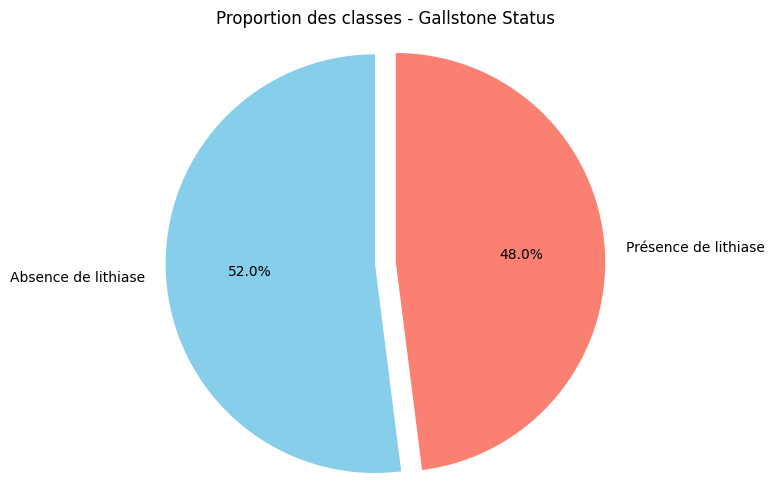

In [82]:
#-------------------------- visualisation de la proportion des classes de la var cible ------------------------------

# Calcul des proportions
proportions = df_model["Gallstone Status"].value_counts(normalize=True).round(2)
labels = proportions.index.map({0: "Absence de lithiase", 1: "Présence de lithiase"})
colors = ["skyblue", "salmon"]

# Camembert
plt.figure(figsize=(6, 6))
plt.pie(proportions, labels=labels, autopct='%.1f%%', colors=colors, startangle=90, explode=[0.05]*len(proportions))
plt.title("Proportion des classes - Gallstone Status")
plt.axis('equal')  # Cercle parfait
plt.show()


#### Commentaire:
- 52% de classe negative contre 48% de classe positive
- Le désiquilibre n'est pas important, il n'est donc pas necessaire de faire un rééchantillonnage


# 4. Modelisation
- Evaluer plusieurs modèles sur leur meilleures performance en gridsearch et validation croisées
- Choix du modèle
- Entrainement du modèle et mesure de performance
- Sauvegarde du modeles

In [84]:
# ------------------------- Séparation des données -------------------
y = df_model["Gallstone Status"]
X = df_model.drop("Gallstone Status", axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [88]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay, roc_curve
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression, Lasso
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier

def evaluer_modeles_classification(X, y, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)

    modeles = {
        "LogisticRegression": {
            "model": LogisticRegression(max_iter=1000),
            "params": {"model__C": [0.1, 1, 10]}
        },
        "RandomForest": {
            "model": RandomForestClassifier(),
            "params": {"model__n_estimators": [50, 100], "model__max_depth": [None, 5, 10]}
        },
        "SVM": {
            "model": SVC(probability=True),
            "params": {"model__C": [0.1, 1, 10], "model__kernel": ["linear", "rbf"]}
        },
        "KNN": {
            "model": KNeighborsClassifier(),
            "params": {"model__n_neighbors": [3, 5, 7]}
        },
        "XGBoost": {
            "model": XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
            "params": {"model__n_estimators": [50, 100], "model__max_depth": [3, 5]}
        },
        "GradientBoosting": {
            "model": GradientBoostingClassifier(),
            "params": {"model__n_estimators": [50, 100], "model__learning_rate": [0.01, 0.1], "model__max_depth": [3, 5]}
        },
        "Lasso": {
            "model": LogisticRegression(penalty='l1', solver='liblinear', max_iter=1000),
            "params": {"model__C": [0.01, 0.1, 1, 10]}
        }
    }

    resultats = []
    courbes_roc = []

    for nom, config in modeles.items():
        print(f"\n ===== Recherche d’hyperparamètres pour {nom} ====")
        pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('model', config["model"])
        ])
        clf = GridSearchCV(pipeline, config["params"], cv=5, scoring="f1", n_jobs=-1)
        clf.fit(X_train, y_train)

        y_pred = clf.predict(X_test)
        y_proba = clf.predict_proba(X_test)[:, 1] if hasattr(clf, "predict_proba") else None

        acc = np.round(accuracy_score(y_test, y_pred),3)
        prec = np.round(precision_score(y_test, y_pred),3)
        rec = np.round(recall_score(y_test, y_pred),3)
        f1 = np.round(f1_score(y_test, y_pred),3)
        auc = np.round(roc_auc_score(y_test, y_proba),3) if y_proba is not None else np.nan

        resultats.append({
            "Modèle": nom,
            "Accuracy": acc,
            "Précision": prec,
            "Rappel": rec,
            "F1-score": f1,
            "AUC": auc,
            "Best Params": clf.best_params_
        })

        # Stocker la courbe ROC si possible
        if y_proba is not None:
            fpr, tpr, _ = roc_curve(y_test, y_proba)
            courbes_roc.append((nom, fpr, tpr, auc))

        # -------------------------- A Decommenter si tu veux afficher les matrices de confusion
        """# Matrice de confusion
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(4, 3))
        sns.heatmap(cm, annot=True, fmt='d', cmap="Blues")
        plt.title(f"Matrice de confusion - {nom}")
        plt.xlabel("Prédit")
        plt.ylabel("Réel")
        plt.tight_layout()
        plt.show()"""
        # ----------------------------- Je le commente pour éviter trop de graphe, car il boucle sur tous les modeles

    # Résumé des performances
    df_resultats = pd.DataFrame(resultats).sort_values(by="F1-score", ascending=False)

    # Courbe ROC combinée
    plt.figure(figsize=(10, 8))
    for nom, fpr, tpr, auc in courbes_roc:
        plt.plot(fpr, tpr, label=f"{nom} (AUC = {auc})")

    plt.plot([0, 1], [0, 1], linestyle='--', color='grey')
    plt.xlabel("Taux de faux positifs")
    plt.ylabel("Taux de vrais positifs")
    plt.title("Courbes ROC comparées des modèles")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Graphique résumé
    df_resultats.set_index("Modèle")[["Accuracy", "Précision", "Rappel", "F1-score", "AUC"]].plot(kind="bar", figsize=(12, 6))
    plt.title("Comparaison des performances des modèles")
    plt.ylabel("Score")
    plt.ylim(0, 1)
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

    # Affichage du meilleur modèle
    best_model = df_resultats.iloc[0]
    print(f"\n Meilleur modèle : {best_model['Modèle']} avec F1-score = {best_model['F1-score']} et AUC = {best_model['AUC']}")

    return df_resultats



 ===== Recherche d’hyperparamètres pour LogisticRegression ====

 ===== Recherche d’hyperparamètres pour RandomForest ====

 ===== Recherche d’hyperparamètres pour SVM ====

 ===== Recherche d’hyperparamètres pour KNN ====

 ===== Recherche d’hyperparamètres pour XGBoost ====

 ===== Recherche d’hyperparamètres pour GradientBoosting ====

 ===== Recherche d’hyperparamètres pour Lasso ====


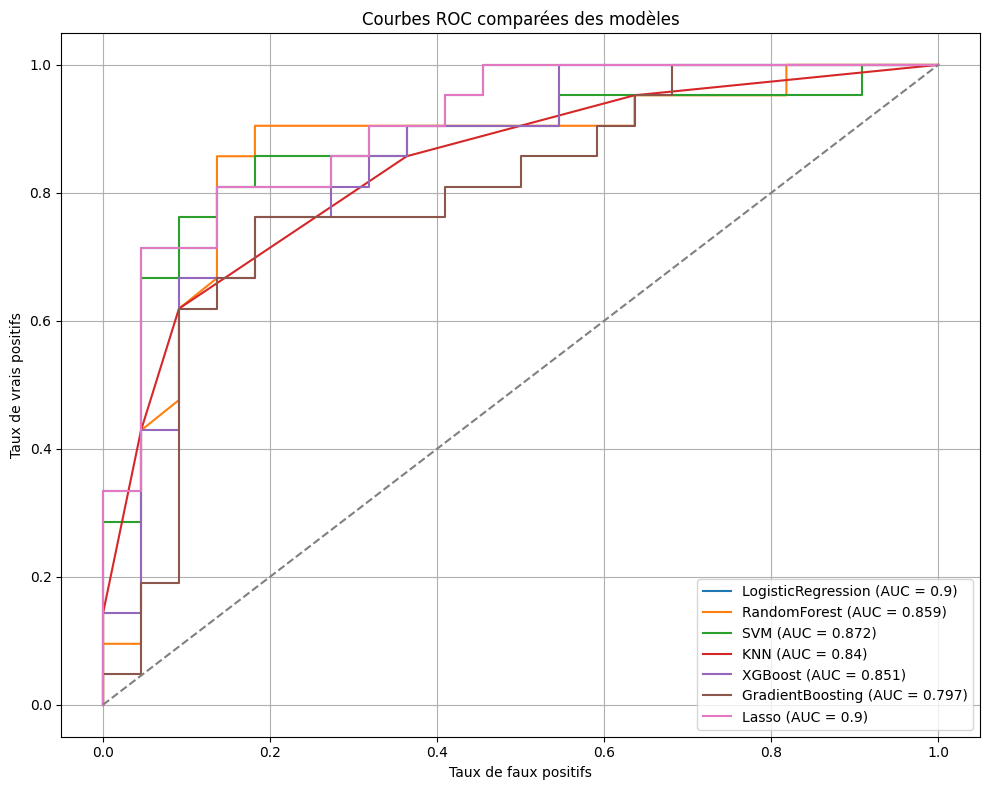

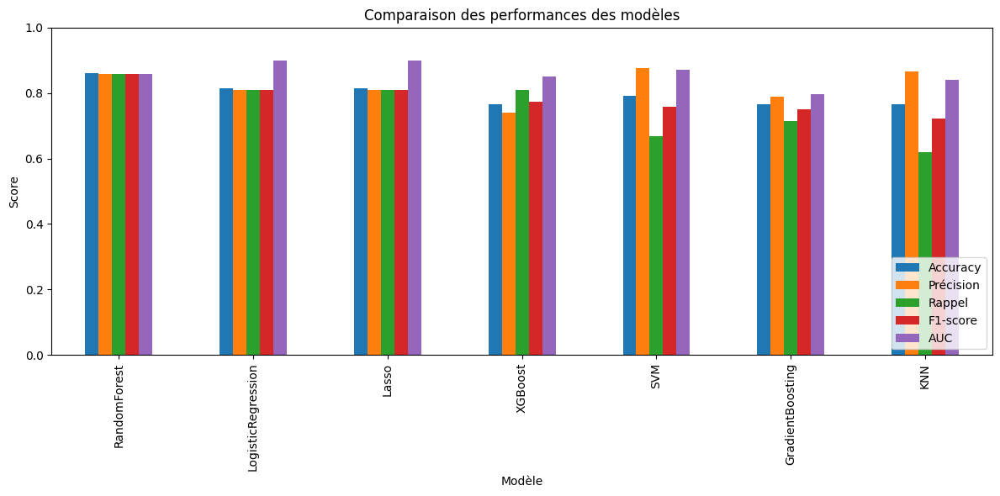


 Meilleur modèle : RandomForest avec F1-score = 0.857 et AUC = 0.859


,Modèle,Accuracy,Précision,Rappel,F1-score,AUC,Best Params
1,RandomForest,0.860,0.857,0.857,0.857,0.859,"{'model__max_depth': 10, 'model__n_estimators'..."
0,LogisticRegression,0.814,0.810,0.810,0.810,0.900,{'model__C': 10}
6,Lasso,0.814,0.810,0.810,0.810,0.900,{'model__C': 10}
4,XGBoost,0.767,0.739,0.810,0.773,0.851,"{'model__max_depth': 3, 'model__n_estimators':..."
2,SVM,0.791,0.875,0.667,0.757,0.872,"{'model__C': 10, 'model__kernel': 'rbf'}"
5,GradientBoosting,0.767,0.789,0.714,0.750,0.797,"{'model__learning_rate': 0.1, 'model__max_dept..."
3,KNN,0.767,0.867,0.619,0.722,0.840,{'model__n_neighbors': 7}


In [89]:
df_resultats = evaluer_modeles_classification(X_train, y_train, test_size=0.2, random_state=42)
df_resultats

##### Description de la methode
- Chercher les meilleurs hyper paramètres de chaque modèle sur une grille avec une validation croisée de 5 blocs
- Comparer tous les modèles avec leurs meilleurs paramètre sur l'accuracy, precision, rappel, F1-score, et AUC
- Accuracy: Taux d'exactitude
- Précision: Taux des bonnes prediction sur l'ensemble des predictions positives
- Rappel: Taux des bonnes prédictions sur l'ensemble des classes positives réelles

Les modeles lineaire (Logistique et Lasso) affichent de très bonne performance
- Avec une profondeur de 10 et 50 estimateurs, le RF est le modèle qui équilibre de hautes performances performance sur tous les indicateurs
- Il est donc raisonnable de choisir l'un de ces modèle. On va donc donc choisir le RF pour la suite (On peut aussi choisir la regression logistique)


RAPPORT DE CLASSIFICATION


,precision,recall,f1-score,support
0,0.777778,0.903226,0.835821,31.000000
1,0.833333,0.652174,0.731707,23.000000
accuracy,0.796296,0.796296,0.796296,0.796296
macro avg,0.805556,0.777700,0.783764,54.000000
weighted avg,0.801440,0.796296,0.791476,54.000000


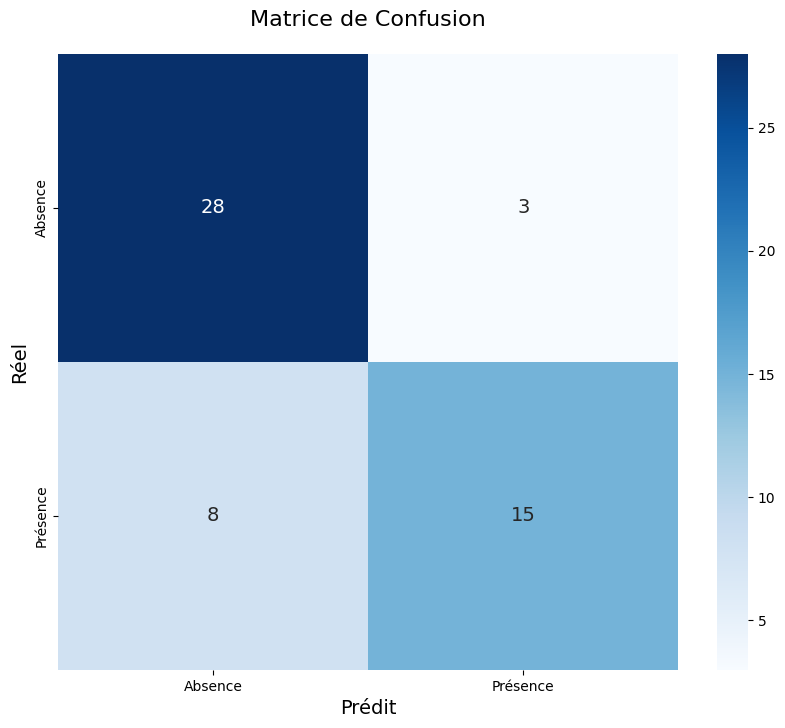

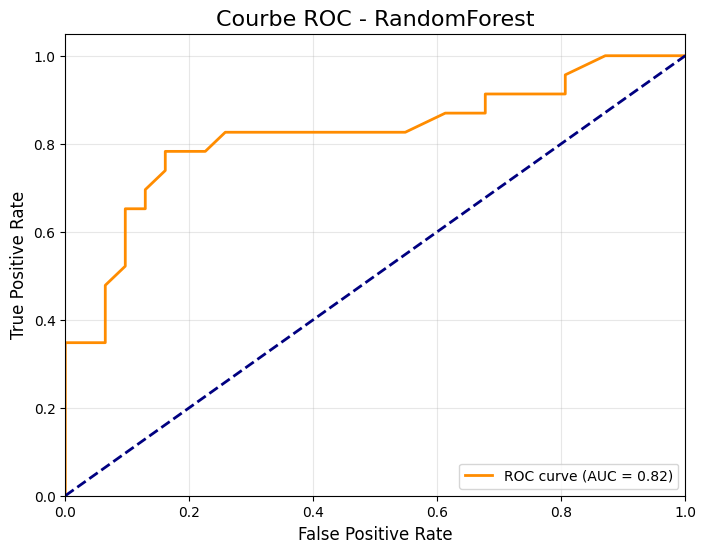

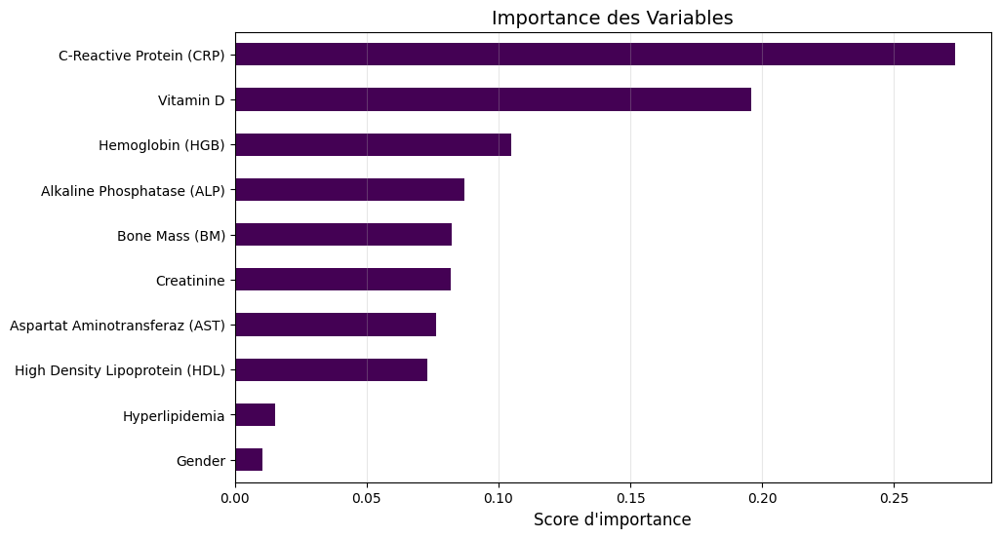

In [114]:
# -------------- Evaluation finale: RF -----------------
from sklearn.metrics import (accuracy_score, classification_report, 
                            confusion_matrix, roc_curve, auc, RocCurveDisplay, precision_score, recall_score, f1_score)
from sklearn.ensemble import RandomForestClassifier
from ipywidgets import interactive


def modele_final_RF(X_train, X_test, y_train, y_test):
    # Entraînement
    model = RandomForestClassifier(n_estimators=50, max_depth=10)
    sc = StandardScaler()
    X_train_copie = X_train.copy()
    #X_train = sc.fit_transform(X_train)
    #X_test = sc.fit_transform(X_test)
    model.fit(X_train, y_train)

    # Prédictions
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    # Rapport de classification
    print("\n\033[1mRAPPORT DE CLASSIFICATION\033[0m")
    report = classification_report(y_test, y_pred, output_dict=True)
    report_df = pd.DataFrame(report).transpose()
    display(report_df.style.background_gradient(cmap='RdYlGn', 
                                                subset=['precision', 'recall', 'f1-score'],
                                                vmin=0, vmax=1))

    # Matrice de confusion
    plt.figure(figsize=(10, 8))
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Absence', 'Présence'], 
                yticklabels=['Absence', 'Présence'],
                annot_kws={"size": 14})
    plt.title('Matrice de Confusion', fontsize=16, pad=20)
    plt.xlabel('Prédit', fontsize=14)
    plt.ylabel('Réel', fontsize=14)
    plt.show()

    # Courbe ROC
    plt.figure(figsize=(8, 6))
    fpr, tpr, thresholds = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='darkorange', lw=2, 
             label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title('Courbe ROC - RandomForest', fontsize=16)
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.show()

    # Importance des variables
    plt.figure(figsize=(10, 6))
    features_imp = pd.Series(model.feature_importances_, index=X_train_copie.columns)
    features_imp.nlargest(10).sort_values().plot(kind='barh', colormap='viridis')
    plt.title('Importance des Variables', fontsize=14)
    plt.xlabel("Score d'importance", fontsize=12)
    plt.grid(axis='x', alpha=0.3)
    plt.show()

    # Analyse interactive du seuil avec métriques dynamiques
    def plot_interactive_roc(threshold):
        y_pred_thresh = (y_proba >= threshold).astype(int)
        cm = confusion_matrix(y_test, y_pred_thresh)
        acc = accuracy_score(y_test, y_pred_thresh)
        prec = precision_score(y_test, y_pred_thresh)
        rec = recall_score(y_test, y_pred_thresh)
        f1 = f1_score(y_test, y_pred_thresh)

        plt.figure(figsize=(15, 6))

        plt.subplot(1, 2, 1)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                    xticklabels=['Absence', 'Présence'], 
                    yticklabels=['Absence', 'Présence'])
        plt.title(f'Matrice de Confusion (Seuil={threshold:.2f})\nAccuracy={acc:.2f}, Precision={prec:.2f}, Recall={rec:.2f}, F1={f1:.2f}')

        plt.subplot(1, 2, 2)
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
        idx = np.argmin(np.abs(thresholds - threshold))
        plt.scatter(fpr[idx], tpr[idx], color='red', s=100, label=f'Seuil choisi ({threshold:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.title('Position du Seuil sur la ROC')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    return model
    widget = interactive(plot_interactive_roc, threshold=(0.1, 0.9, 0.05))
    display(widget)


model = modele_final_RF(X_train, X_test, y_train, y_test)

In [115]:
# Sauvegarde
import joblib

joblib.dump(model, 'prediction_modelRF.pkl')

['prediction_modelRF.pkl']

In [116]:
X_train.columns

Index(['Gender', 'Hyperlipidemia', 'Bone Mass (BM)',
       'High Density Lipoprotein (HDL)', 'Aspartat Aminotransferaz (AST)',
       'Alkaline Phosphatase (ALP)', 'Creatinine', 'C-Reactive Protein (CRP)',
       'Hemoglobin (HGB)', 'Vitamin D'],
      dtype='object')

# SPECIALE LASSO

In [10]:
df_lasso = non_extremes_rows.copy()
y = df_lasso["Gallstone Status"]
X = df_lasso.drop("Gallstone Status", axis=1)

In [ ]:


from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score, confusion_matrix,
    roc_curve, classification_report
)
from sklearn.preprocessing import StandardScaler

def selection_lasso2(X, y, test_size=0.2, random_state=42):
    # --- Standardisation ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Split Train/Test ---
    X_train, X_test, y_train, y_test = train_test_split(
        X_scaled, y, test_size=test_size, random_state=random_state, stratify=y)

    # --- Régression Lasso avec Validation Croisée ---
    print(" Entraînement du modèle Lasso Logistic Regression...")
    lambda_values = np.logspace(-4, 1, 50)  # λ ∈ [0.0001, 10]
    C_values = 1 / lambda_values
    model = LogisticRegressionCV(
        Cs=C_values,
        cv=5,
        penalty='l1',
        solver='saga',
        scoring='accuracy',
        max_iter=10000,
        random_state=random_state,
        refit=True
    )
    model.fit(X_train, y_train)

    # --- Analyse de Lambda (1/C) ---
    print(" Analyse de la régularisation (lambda)...")
    C_values = model.Cs_
    lambda_values = np.round(1 / C_values, 4)
    scores_val = model.scores_[1]  
    mean_scores_val = np.mean(scores_val, axis=0)
    std_scores_val = np.std(scores_val, axis=0)

    best_lambda = round(1 / model.C_[0], 4)

    # --- Courbe Accuracy vs Lambda 
    plt.errorbar(lambda_values, mean_scores_val, yerr=std_scores_val,
                 fmt='-o', color='purple', ecolor='gray', capsize=5)
    plt.axvline(best_lambda, color='red', linestyle='--', label=f"Lambda optimal = {best_lambda}")
    plt.gca().invert_xaxis()
    plt.xlabel("Lambda (1/C)")
    plt.ylabel("Accuracy moyenne (CV)")
    plt.title("Validation croisée : Accuracy vs Lambda")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- Évolution des coefficients vs Lambda 
    print(" Évolution des coefficients selon Lambda...")
    all_coefs = []

    for C in C_values:
        model_temp = LogisticRegression(
            penalty='l1', solver='saga', C=C, max_iter=10000, random_state=random_state)
        model_temp.fit(X_train, y_train)
        all_coefs.append(model_temp.coef_.flatten())

    all_coefs = np.array(all_coefs)
    feature_names = X.columns if isinstance(X, pd.DataFrame) else [f'x{i}' for i in range(X.shape[1])]

    plt.figure(figsize=(10, 6))
    for i in range(X.shape[1]):
        plt.plot(lambda_values, all_coefs[:, i], label=feature_names[i])
    plt.axvline(best_lambda, color='red', linestyle='--', label=f"Lambda optimal = {best_lambda}")
    plt.gca().invert_xaxis()
    plt.xlabel("Lambda (1/C)")
    plt.ylabel("Coefficient")
    plt.title("Évolution des coefficients vs régularisation")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- Prédictions & Scores ---
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    print("\n Rapport de classification :")
    print(classification_report(y_test, y_pred))

    print(" Accuracy :", accuracy_score(y_test, y_pred))
    print(" F1-score :", f1_score(y_test, y_pred))
    print(" AUC ROC :", roc_auc_score(y_test, y_proba))

    # --- Matrice de Confusion ---
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title("Matrice de confusion")
    plt.xlabel("Prédit")
    plt.ylabel("Réel")
    plt.show()

    # --- Courbe ROC ---
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    plt.plot(fpr, tpr, label='ROC (AUC = {:.2f})'.format(roc_auc_score(y_test, y_proba)))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title("Courbe ROC")
    plt.xlabel("Faux Positifs")
    plt.ylabel("Vrais Positifs")
    plt.legend()
    plt.grid(True)
    plt.show()

    
    # --- Coefficients finaux (Lasso optimal) ---
    coef = model.coef_.flatten()
    selected = np.where(coef != 0)[0]
    print(f"\n {len(selected)} variables sélectionnées sur {X.shape[1]} :")
    selected_features = pd.Series(coef[selected], index=np.array(feature_names)[selected])
    print(selected_features.sort_values(key=abs, ascending=False))

    # --- Graphe des coefficients sélectionnés ---
    selected_features.sort_values(key=abs).plot(kind='barh', figsize=(8, 6), color='teal')
    plt.title("Importance des variables sélectionnées (modèle final)")
    plt.xlabel("Coefficient")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


 Entraînement du modèle Lasso Logistic Regression...
 Analyse de la régularisation (lambda)...


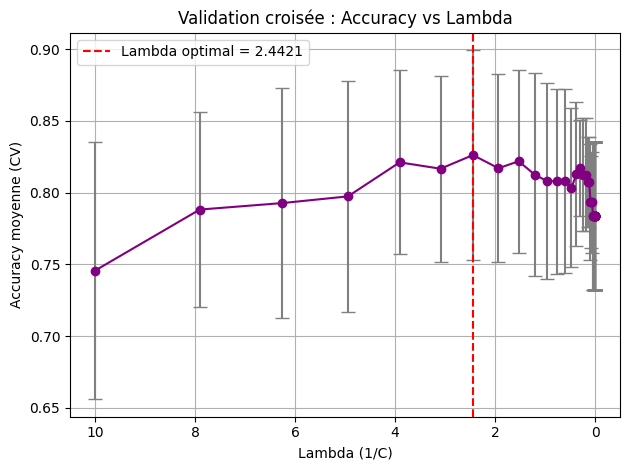

 Évolution des coefficients selon Lambda...


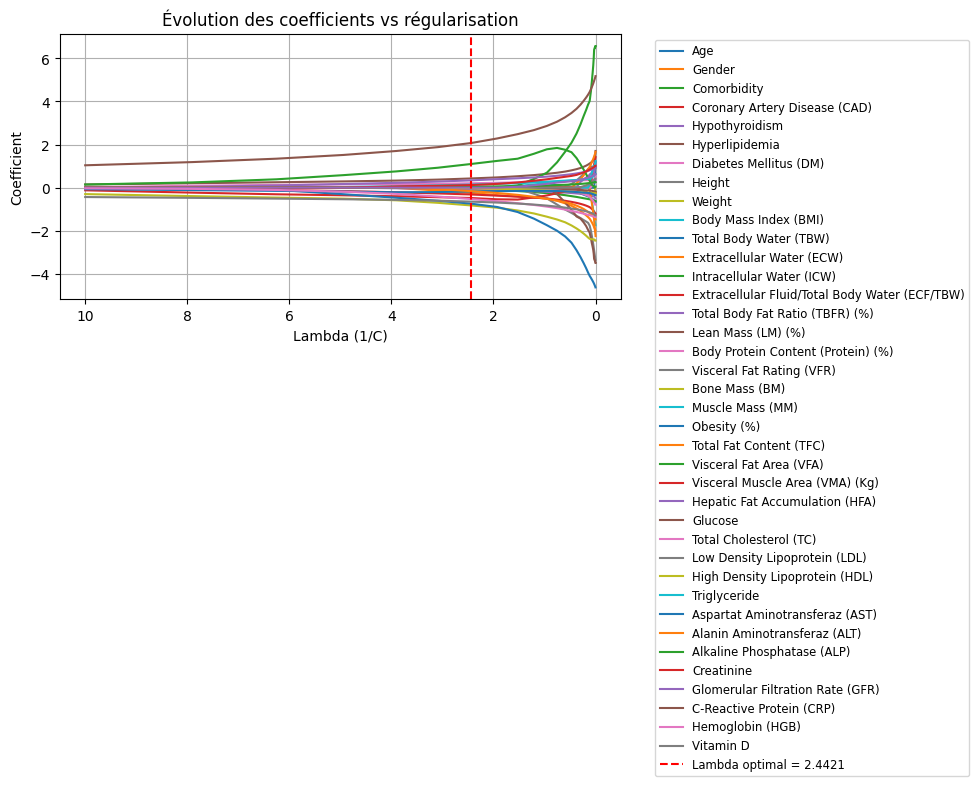


 Rapport de classification :
              precision    recall  f1-score   support

           0       0.81      0.89      0.85        28
           1       0.87      0.77      0.82        26

    accuracy                           0.83        54
   macro avg       0.84      0.83      0.83        54
weighted avg       0.84      0.83      0.83        54

 Accuracy : 0.8333333333333334
 F1-score : 0.8163265306122449
 AUC ROC : 0.9120879120879121


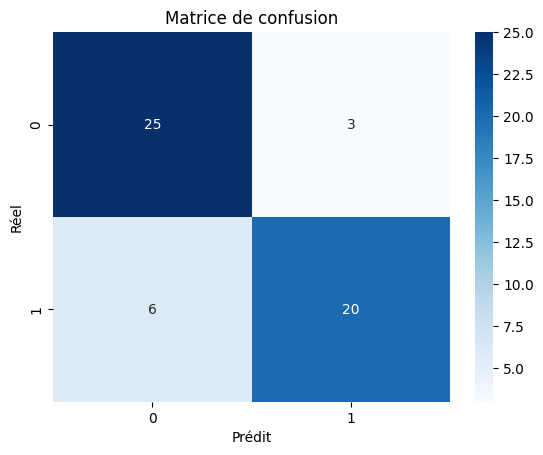

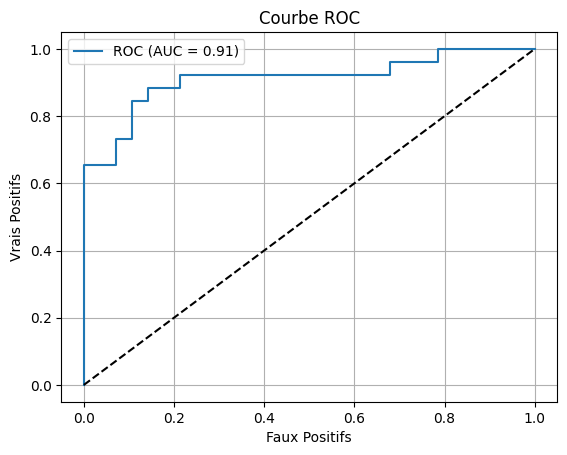


📌 21 variables sélectionnées sur 38 :
C-Reactive Protein (CRP)                          2.070147
Visceral Fat Area (VFA)                           1.096573
Bone Mass (BM)                                   -0.825725
Obesity (%)                                      -0.744149
Vitamin D                                        -0.649589
Hemoglobin (HGB)                                 -0.529923
Extracellular Fluid/Total Body Water (ECF/TBW)   -0.481763
Hyperlipidemia                                    0.425694
Hepatic Fat Accumulation (HFA)                    0.337225
Coronary Artery Disease (CAD)                    -0.317159
Gender                                           -0.245033
Diabetes Mellitus (DM)                            0.202724
Aspartat Aminotransferaz (AST)                   -0.178455
Alanin Aminotransferaz (ALT)                     -0.162239
Triglyceride                                      0.140073
Creatinine                                        0.119049
Hypothyroidism   

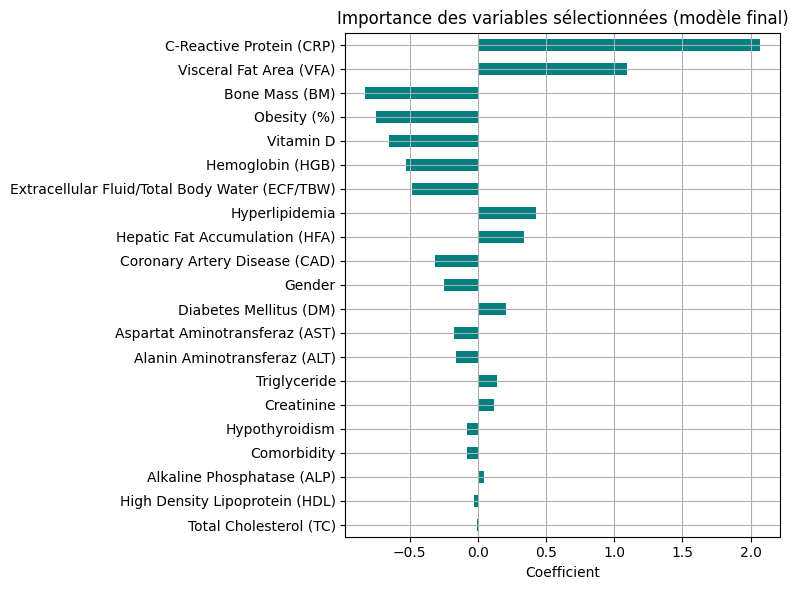

In [30]:
selection_lasso2(X, y, test_size=0.2, random_state=42)

- La performance optimale du modèle est obtenue pour lambda = 2.4421
- Pour cette valeur de lambda, toutes les variables ont leur coéfficient entre -2 et 2
- Cependant, seulement 21 des variables restent dans le modèle. Cette pénalité nous permet de selectionner 21 variables sur 38
- Les variables sont rangées selon leur importance dans le modèle sur la derniere figure (A commenter)
- Le modele affiche de bonne performance, notamment : 
- accuracy 0.83 , 
- Précision: 0.84 (84% des cas positifs predits par le modèle le sont effectivement )
- Rappel : 0.83 ( Le modèle arrive à detecter 83% des cas positif)

# Conclusion
- En conclusion,la selection des variables par les methodes statistiques permettent de nous ramener à 10 variables sur les 38 
- Le RF appliqué à l'issue de cette methode affiche un taux d'exactitude d'environ 80%
--------------- Tu fais une sythèse des 2 approches